In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys, os


In [62]:
sns.set_theme(context = 'notebook', style = 'white', palette = 'muted', font_scale = 1.35)

In [3]:
sys.path.insert(0, os.path.abspath('..'))
from scripts.project_functions import load_and_process
df = load_and_process("../data/raw/winequality-red.csv", "../data/raw/winequality-white.csv" )

# Task 4

# Exploratory data analysis (EDA)

### Taking a look at the data:

In [4]:
# Taking a look at the first five rows of the dataframe
df.head()

,wine_type,citric acid,fixed acidity,volatile acidity,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,alcohol,quality,quality_label
0,red wine,0.22,6.8,0.56,1.8,0.074,15.0,24.0,0.99438,3.40,11.2,6,medium quality
1,white wine,0.36,6.4,0.30,2.0,0.052,18.0,141.0,0.99273,3.38,10.5,6,medium quality
2,white wine,0.29,5.9,0.17,3.1,0.030,32.0,123.0,0.98913,3.41,13.7,7,medium quality
3,white wine,0.24,7.0,0.24,1.8,0.047,29.0,91.0,0.99251,3.30,9.9,6,medium quality
4,white wine,0.07,6.4,0.45,1.1,0.030,10.0,131.0,0.99050,2.97,10.8,5,low quality


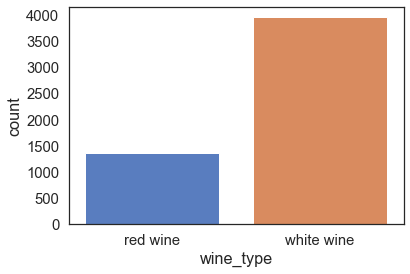

In [5]:
# Finding out the distribution of the data by the wine type
sns.countplot(x='wine_type',data = df)
sns.set(rc={'figure.figsize':(7,5)})

### There is more white wine data than red wine data.

In [6]:
# How many rows and columns are there in this dataframe
df.shape


(5320, 13)

In [7]:
#What columns are there in this dataframe 
df.columns

Index(['wine_type', 'citric acid', 'fixed acidity', 'volatile acidity',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'alcohol', 'quality',
       'quality_label'],
      dtype='object')

In [8]:
# using .info() to get summary information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5320 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   wine_type             5320 non-null   object 
 1   citric acid           5320 non-null   float64
 2   fixed acidity         5320 non-null   float64
 3   volatile acidity      5320 non-null   float64
 4   residual sugar        5320 non-null   float64
 5   chlorides             5320 non-null   float64
 6   free sulfur dioxide   5320 non-null   float64
 7   total sulfur dioxide  5320 non-null   float64
 8   density               5320 non-null   float64
 9   pH                    5320 non-null   float64
 10  alcohol               5320 non-null   float64
 11  quality               5320 non-null   int64  
 12  quality_label         5320 non-null   object 
dtypes: float64(10), int64(1), object(2)
memory usage: 741.9+ KB


### We should also check if there are any missing or null values in the dataset.

In [9]:
#Check for null values in the dataset
df.isna().sum()

wine_type               0
citric acid             0
fixed acidity           0
volatile acidity        0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
alcohol                 0
quality                 0
quality_label           0
dtype: int64

This shows that there are no nan values and so the dropna() function will not be needed.

### Looking at general summary statistics using `df.describe()`

In [10]:
# summary statistics for numerical variables in the dataframe
df.describe(include =[np.number]).T

,count,mean,std,min,25%,50%,75%,max
citric acid,5320.0,0.318494,0.147157,0.00000,0.2400,0.31000,0.40000,1.66000
fixed acidity,5320.0,7.215179,1.319671,3.80000,6.4000,7.00000,7.70000,15.90000
volatile acidity,5320.0,0.344130,0.168248,0.08000,0.2300,0.30000,0.41000,1.58000
residual sugar,5320.0,5.048477,4.500180,0.60000,1.8000,2.70000,7.50000,65.80000
chlorides,5320.0,0.056690,0.036863,0.00900,0.0380,0.04700,0.06600,0.61100
free sulfur dioxide,5320.0,30.036654,17.805045,1.00000,16.0000,28.00000,41.00000,289.00000
total sulfur dioxide,5320.0,114.109023,56.774223,6.00000,74.0000,116.00000,153.25000,440.00000
density,5320.0,0.994535,0.002966,0.98711,0.9922,0.99465,0.99677,1.03898
pH,5320.0,3.224664,0.160379,2.72000,3.1100,3.21000,3.33000,4.01000
alcohol,5320.0,10.549241,1.185933,8.00000,9.5000,10.40000,11.40000,14.90000


In [11]:
# summary statistics of string variables in the dataframe
df.describe(include=[object])

,wine_type,quality_label
count,5320,5320
unique,2,3
top,white wine,medium quality
freq,3961,3179


### We can create a profiling report using pandas_profiling that will present us with a report that shows interactions, missing values, duplicate data and any correlations between the data.

In [12]:
import pandas_profiling
from pandas_profiling import ProfileReport
winequality_profile = ProfileReport(df, title = "Wine Quality Profiling report")
winequality_profile

By looking at the report below, I make the following inferences:
- there are no missing cells so no null values in the dataframe, which confirms the isna() function's above.
- there are no duplicate rows because that was dealt with in the method chains for the load_and_process() function above.
- there are twelve numeric variables and two catergorical variables that we created i.e., wine_type and quality_label
- when you look at the distributions(in the histograms) of the individual variables:
     - **citric acid** has a normal distribution, which shows that the majority of values is close to average with few outliers.
     - **fixed acidity** has a histogram with a left skewed distribution showing that common values are between 6 and 8.
     - **volatile acidity** similar to fixed acidity, it has a left skew showing that many of the wines had a  low volatile acidity.
     - **residual sugar** has a strong left skew showing that most of the values are in the lower range.
     - **chlorides** also has a strong left skew.
     - **free sufur dioxide** has a slight left skew showing that athough many of the values are evenly distributed, there are very few values in the 95th percentile as compared to the rest of the range.
     - **total supfur dioxide** has a normal distribution with a few outliers.
     - **density** is also normally distributed.
     - **pH** is also normally distributed.
     - **alcohol** is skewed to the left. 


Text(0.5, 0.98, 'Wine Attributes Pairwise Plots by Types')

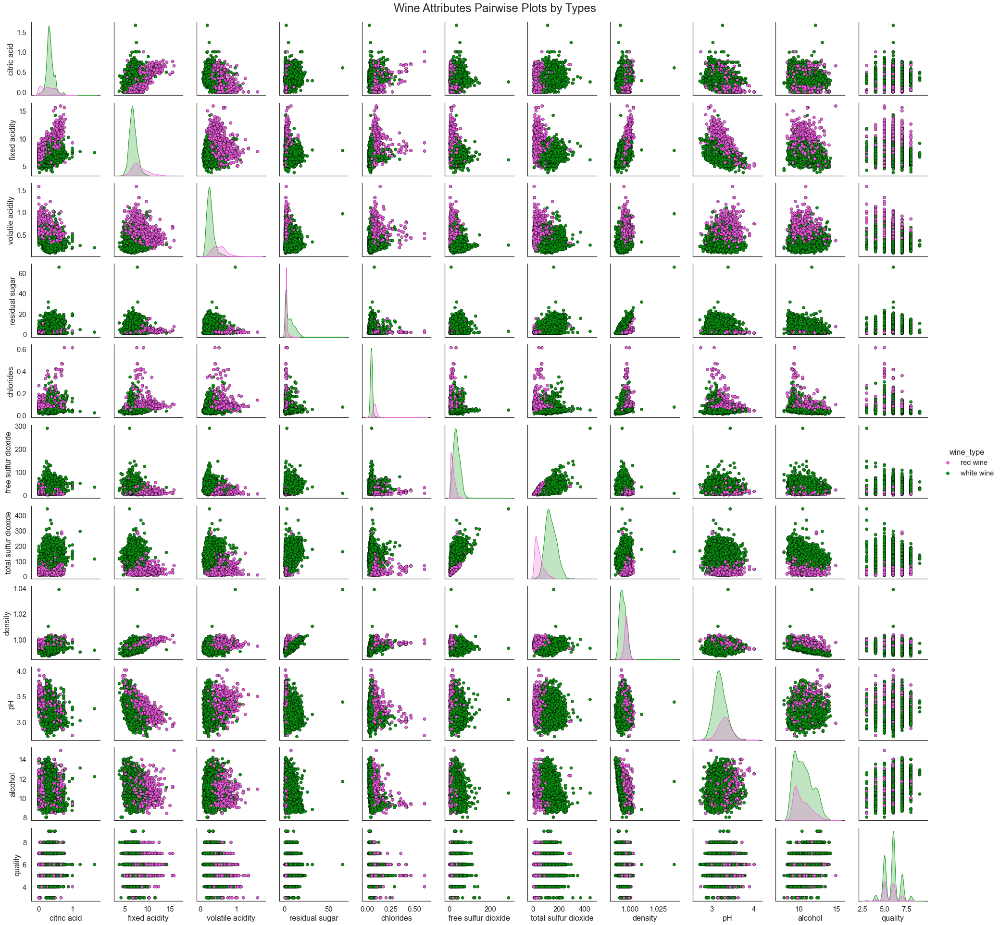

In [24]:
#create a pairplot to look at the correlation between the variables in terms of wine types in the dataset
winetype_pairplot = sns.pairplot(data = df, 
                             hue='wine_type', 
                             palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
                             plot_kws=dict(edgecolor='black', linewidth=0.5)
                                 ) 
plt.subplots_adjust(top=0.96, wspace=0.2)
plt.suptitle('Wine Attributes Pairwise Plots by Types', fontsize=24)

From the pairplot above, we can notice a few things about the two types of wines:
- Red wine has higher fixed acidity, volatile acidity and chlorides in general.
- White wine has higher free sulfur dioxide, total sulphur dioxide and residual sugar.
- alcohol and density have a slight negative correlation in that a higher alcohol quantity will mean a lower density. There are a few outliers to this.
- fixed acidity and density has a slight positive correlation showing that an increase in fixed acidity will lead to a small increase in density.
- residual sugar also has a positive correlation with density and so an increase in this attribute will lead to an increase in density.

### On an individual level, let's look at the quality distribution of wine by type.

Text(0, 0.5, '')

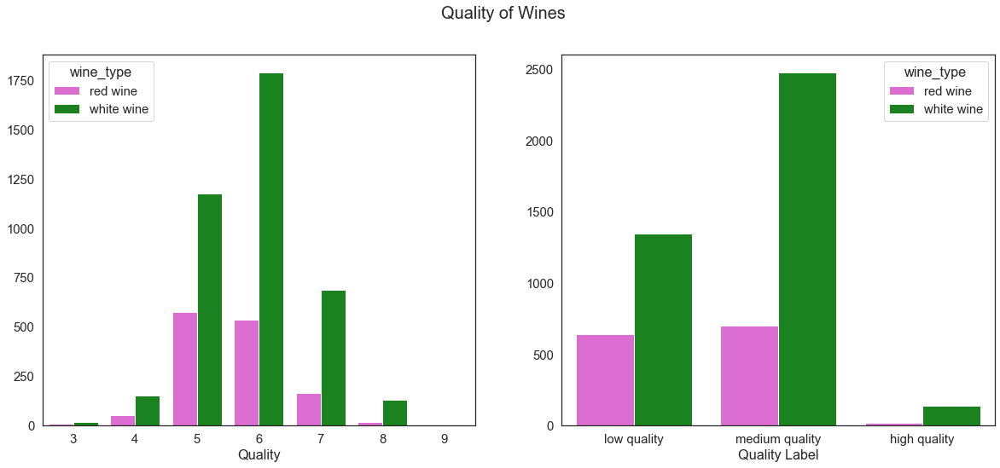

In [26]:
#Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
f.suptitle('Quality of Wines', fontsize=20)

#Plotting the relationship between quality and wine by type
sns.countplot(x = 'quality', 
              hue = 'wine_type',
              palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
              data = df, 
              ax = ax1
             )
ax1.set_xlabel("Quality")
ax1.set_ylabel("")

#Plotting the relationship between quality_label and wine by type
sns.countplot(x = 'quality_label', 
              hue = 'wine_type',
              palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
              data = df , 
              order = ['low quality', 'medium quality', 'high quality'], 
              ax = ax2
             )
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("")


From this we can see that:
- both the wine types have a higher number of medium or average quality wines.
- both the wines also have a relatively low number of high quality wines.
- the difference is however, white wines have significantly bigger difference between the number of low quality and medium quality wines. The red wines have a much smaller difference between the number of low quality and medium quality wines.  

### We can also look at the quality attribute in relation to alcohol content

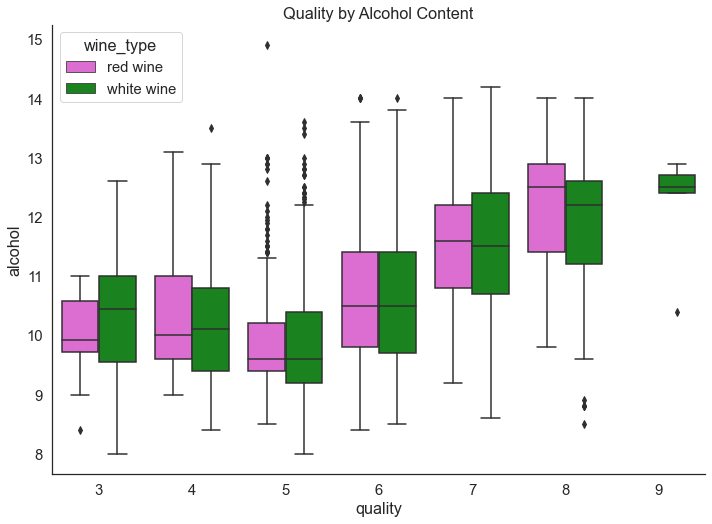

In [31]:
#plot a box plot to show the 
sns.boxplot(data = df, 
            x = 'quality', 
            y = 'alcohol', 
            hue = 'wine_type', 
            palette={'red wine': '#ED5CDE', 'white wine': '#09940F'}
           )
plt.title("Quality by Alcohol Content")
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.despine()


This boxplot looks like it will be helpful for further analysis in my research question 1 and since i will most likely use it in a subplot i can wrap this in a function and save it in the **project_functions.py** file to call it later.

In [69]:
#this is the wrapped function that will go onto the project_functions.py file 
def boxplot1(a, x, y , z):
    boxplot = sns.boxplot(ax = a, 
                data = df, 
            x = x, 
            y = y, 
            hue = z, 
            palette={'red wine': '#ED5CDE', 'white wine': '#09940F'}
           )
    return boxplot


# Task 5
### Research Questions 
- **Research question 1:** Do the best wines have a high alcohol content or a high fixed acidity, or both?
    - `Initial thoughts`
        - First it would be wise to look at the correlation between alcohol and fixed acidity because it will give us a rough idea if it would affect quality in the same way.
        - We can then look at the relationship between alcohol and quality, and fixed acidity and quality on an individual level.
        - if results show both have an effect on quality we can combine them and then compare them with quality.
- **Research question 2:** Does the amount of residual sugar in white wines lead to a higher density for those wines? 
    - `Initial thoughts`
        - using .loc to remove red wine data.
        - dropping any columns that aren't needed.
        - Finding the correlation between the two variables.
- **Research question 3:** Does acidity based on the fixed acidity and pH have an effect on the quality of the wine samples?
    - `Initial thoughts`
        - Look at the correlation between the fixed acidity and ph of red wine samples.
        - using dataframe from above we can edit it further to make it useful for our analysis.
        - dropping any columns that aren't needed.
        - looking at quality based on both these attributes.

---

## Research question 1
#### Do the best wines have a high alcohol content or a high fixed acidity, or both?

**Let us first take a look at the correlation between  alcohol and fixed acidity.**

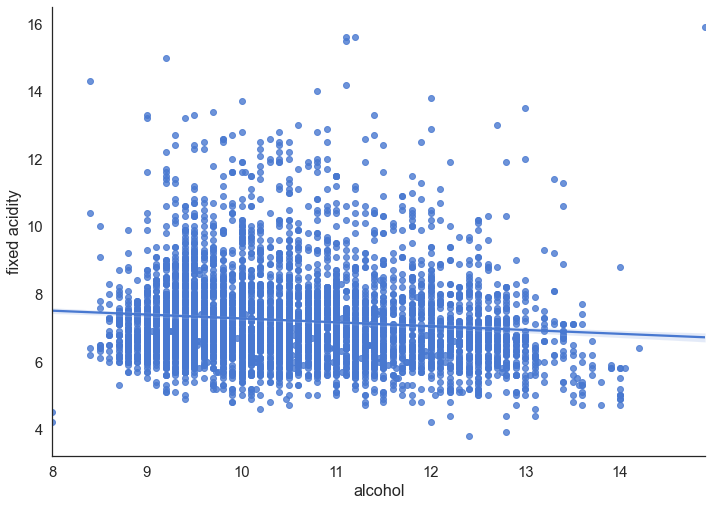

In [33]:
#using regplot() to find a correlation
sns.regplot(data = df, x = 'alcohol', y = 'fixed acidity')
sns. despine()

**To be more exact we can calculate the pairwise correlation between the the two attributes**

In [17]:
correlation = df['fixed acidity'].corr(df['alcohol'])
round(correlation , 4)

-0.1026

A negative correlation as shown above means that the the two variables are moving in the opposite direction; an increase in alcohol levels will lead to a reduction in fixed acidity. It is important to note that the value -0.1026 is representative of an extremely week correlation - this is backed up by the almost flat regression line in the plot. So a change in alcohol would cause a very small change in fixed acidity. 

**Lets look at the quality of each wine by alcohol content. We can use the boxplot in our EDA to look at this**

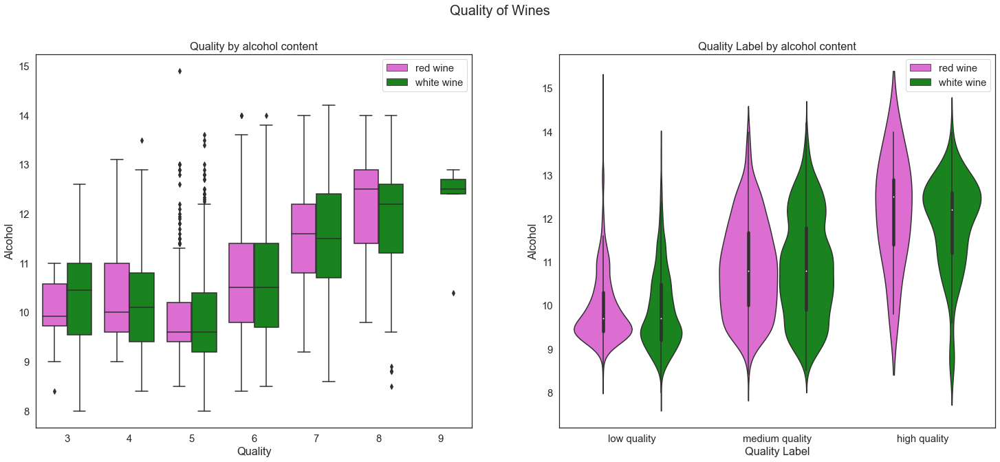

In [68]:
sys.path.insert(0, os.path.abspath('..'))
from scripts.project_functions import *

#Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.suptitle('Quality of Wines', fontsize=20)

#Plotting the box plot of alcohol by quality by using the function from project_functions.py
boxplot1(ax1, 'quality', 'alcohol','wine_type')
ax1.set_title("Quality by alcohol content")
ax1.set_xlabel("Quality")
ax1.set_ylabel("Alcohol")
ax1.legend(loc = 'best')


#Plotting the violin plot of alcohol by quality label
sns.violinplot(ax = ax2, 
               data = df, 
               x = 'quality_label', 
               y = 'alcohol', 
               hue = 'wine_type', 
               palette={'red wine': '#ED5CDE', 'white wine': '#09940F'}, 
               order = ['low quality', 'medium quality', 'high quality']
              )
ax2.set_title("Quality Label by alcohol content")
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("Alcohol")
ax2.legend(loc = 'best')

From this box plot the following can be inferred:
- Generally speaking, the higher the alcohol content the higher the quality of the wine.
- Only white wine has the highest quality  of 9.
- Both wines with quality 5 and 6 have the same median value. 
- Both wines with quality 5 have more outliers than the rest of the quality values.

From the violin plot:
- Low quality wines are showing a distribution that is skewed to the left which means that majority of the wines in this range have a low alcohol content.
- medium quality wines have a normal distribution meaning the values are more evenly spread in terms of alcohol content.
- high quality wines are showing a distribution that is skewed to the right which means that majority of the wines in this range have a higher alcohol content.

**Lets look at this from the perspective of fixed acidity; what would the quality of wines be based on fixed acidity. Using the function boxplot1  we can plot a similar boxplot to the one above**

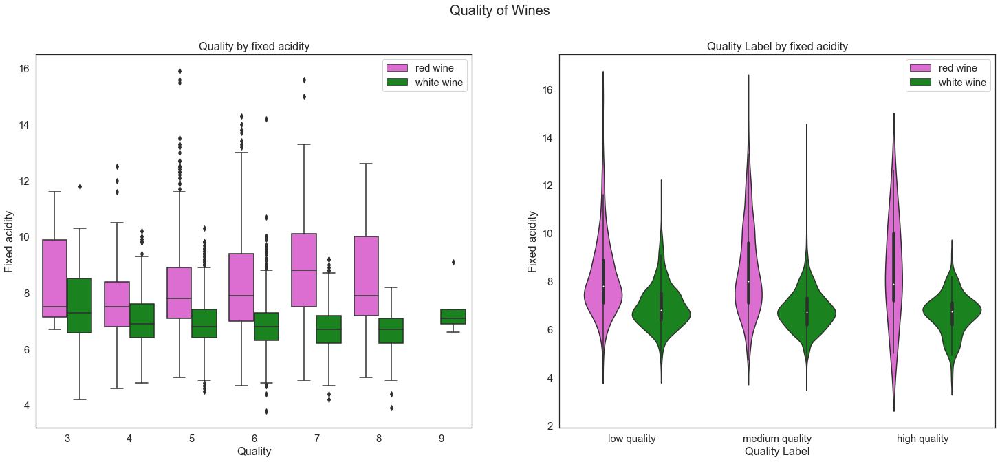

In [70]:
#Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.suptitle('Quality of Wines', fontsize=20)

#Plotting the box plot of fixed acidity by quality by using the function from project_functions.py
boxplot1(ax1, 'quality', 'fixed acidity','wine_type')
ax1.set_title("Quality by fixed acidity")
ax1.set_xlabel("Quality")
ax1.set_ylabel("Fixed acidity")
ax1.legend(loc = 'best')


#Plotting the violin plot of fixed acidity by quality label
sns.violinplot(ax = ax2, 
               data = df, 
               x = 'quality_label', 
               y = 'fixed acidity', 
               hue = 'wine_type', 
               palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
               order = ['low quality', 'medium quality', 'high quality']
              )
ax2.set_title("Quality Label by fixed acidity")
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("Fixed acidity")
ax2.legend(loc = 'best')

From this box plot the following can be inferred:
- At first glance all the boxplots are located in similar ranges and we cant immediately conclude that a different fixed acidities lead to changes in quality.
- Only white wine has the highest quality  of 9 but this has nothing to do with fixed acidity.
- The medians of all red wine samples by quality are all close to each other. This is the same case with the white wines.
From the violin plot:
- all the plots for both wines have normal distributions with the same medians. 

### Conclusions based on Research Question 1

   - The best wines tend to be of a higher quality.
   - When we looked at the correlation between alcohol and fixed acidity at the beginning we could see that there is a negative correlation between the two. This made me tentatively think that if one of the variables had a bigger effect on quality, the other would not.
   - Looking at the box and violin plot for the relationship between alcohol content and quality it could be seen that the lower the alcohol content the lower the quality of wines.
   - Looking at the box and violin plot for the relationship between fixed acidity content and quality we can see that because of the relatively similar values accross each quality label.
   - Therefore, we can conclude that the best quality wines have a high alcohol content and fixed acidity has little to no effect on the quality of wines.
   
---

## Research question 2

#### Does the amount of residual sugar in white wines lead to a higher density for those wines? 

**For this question it would be best to edit the dataframe more for better analysis**

In [20]:
dfa = (df
       #drop the columns that we will not be using in this analysis
       .drop(columns = ['citric acid', 'fixed acidity', 'volatile acidity', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide','pH', 'alcohol', 'quality', 'quality_label'])
       #drop all the red wine rows.
       .loc[lambda row : ~row['wine_type'].str.contains('red wine')]
       .drop(columns = ['wine_type'])
      )
       
dfa

,residual sugar,density
1,2.0,0.99273
2,3.1,0.98913
3,1.8,0.99251
4,1.1,0.99050
5,6.8,0.99280
...,...,...
6487,1.3,0.99398
6489,1.0,0.99289
6490,1.3,0.99352
6493,1.1,0.99366


**Now that we have wrangled our data to create a dataframe that includes only the data needed for this question, lets take a look at the correlation between the two variables.**

Text(0.5, 1.0, 'Scatterplot of density and residual sugar')

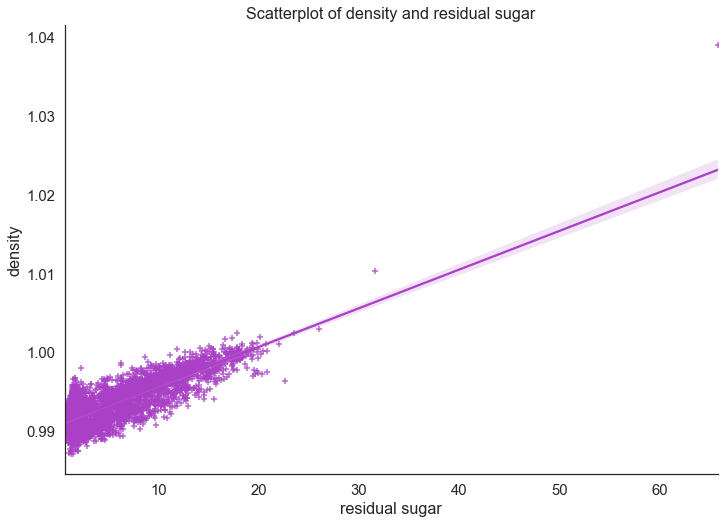

In [40]:
#using regplot() to find a correlation
sns.regplot(data = dfa, 
            x = 'residual sugar', 
            y = 'density', 
            marker= "+", 
            color = '#A940C6'
           )
sns.despine()
plt.title("Scatterplot of density and residual sugar")

**Again to be more exact we can calculate the pairwise correlation between the the two attributes.**

In [22]:
correlation2 = dfa['residual sugar'].corr(dfa['density'])
round(correlation2 , 4)

0.8205

### Conclusions based on Research Question 2

- Immediately from the plot we can see a positive trend between the residual sugar and density which allows us to conclude that an increase  in the residual sugar will lead to an increase in the density of the wine.
- If we were to look at this based on the correlation coefficient, a perfect positive correlation would be 1. In this case 0.8205 is close to 1 so there is a strong correlation so an increase in residual sugar will lead to a significant increase density of the wines

---

## Research question 3

#### Does acidity, based on the fixed acidity and pH, have an effect on the quality of the wine samples?

**We should first wrangle the dataframe to make a new dataframe that will suit this analysis better**

In [51]:
dfb = (df
       #drop the columns that we will not be using in this analysis
       .drop(columns = ['citric acid', 'residual sugar', 'density', 'volatile acidity', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'alcohol'])
       #drop all the red wine rows.
       .loc[lambda row : ~row['wine_type'].str.contains('white wine')]
       #drop wine_type because it is now redundant.
       .drop(columns = ['wine_type'])
       #create a longer dataframe so that there is a singular column 'Attributes'
       .melt(id_vars=['quality', 'quality_label'] , 
                              value_vars=['fixed acidity', 'pH'], 
                              var_name='attributes', 
                              value_name='values')
      )
       
dfb

,quality,quality_label,attributes,values
0,6,medium quality,fixed acidity,6.80
1,5,low quality,fixed acidity,9.50
2,5,low quality,fixed acidity,7.30
3,7,medium quality,fixed acidity,8.20
4,4,low quality,fixed acidity,6.40
...,...,...,...,...
2713,6,medium quality,pH,3.43
2714,5,low quality,pH,3.52
2715,6,medium quality,pH,3.00
2716,5,low quality,pH,3.36


**Then we should look at the correlation between fixed acidity and pH more closely.**

Text(0.5, 1.0, 'Scatterplot of fixed acidity and pH')

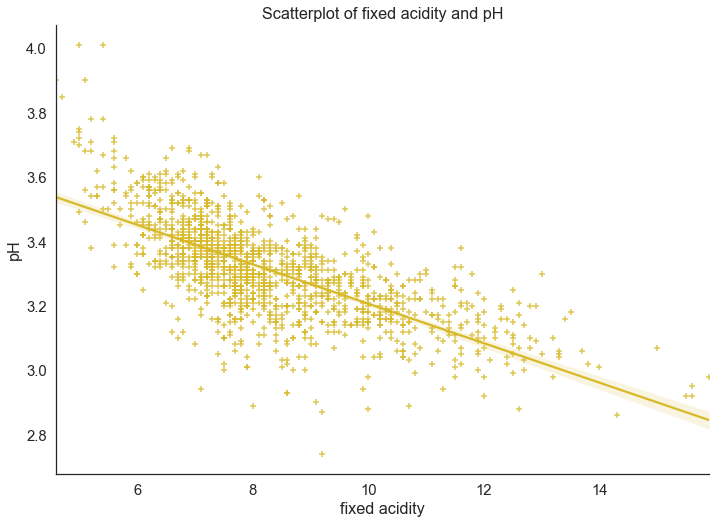

In [45]:
#using regplot() to find a correlation
sns.regplot(data = dfb, 
            x = 'fixed acidity', 
            y = 'pH', 
            marker= "+", 
            color = '#D8B929'
           )
sns.despine()
plt.title("Scatterplot of fixed acidity and pH")

**And again, like in the previous questions we should find an exact value for the correlation coefficient since it will help us in our analysis**

In [46]:
correlation3 = dfb['fixed acidity'].corr(dfb['pH'])
round(correlation3 , 4)

-0.6867

A negative correlation means that these variables are "moving in the opposite direction"; an increase in fixed acidity will lead to a fall in the pH level.

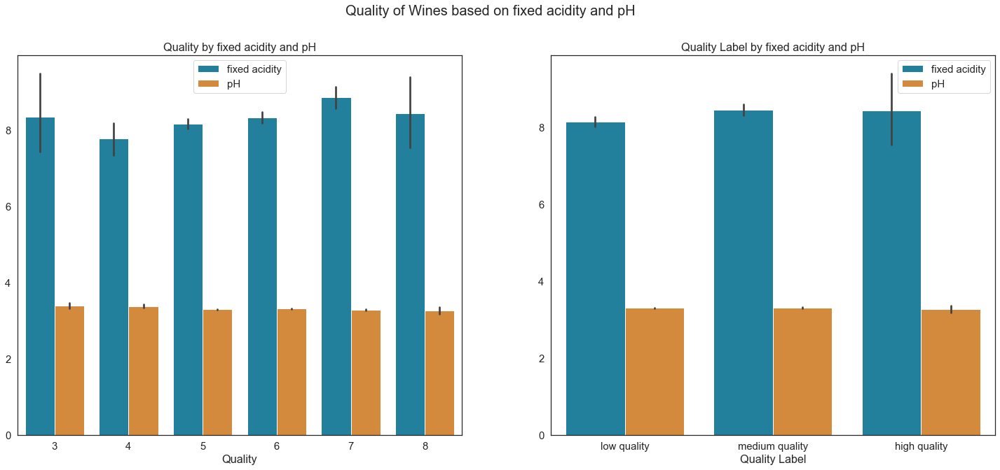

In [71]:
# Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.suptitle('Quality of Wines based on fixed acidity and pH', fontsize=20)

#Plotting the bar plot of fixed acidity and pH by quality
sns.barplot(ax = ax1, 
            data= dfb , 
            x = 'quality', 
            y = 'values', 
            hue = 'attributes', 
            palette={'fixed acidity': '#0F8BB0', 'pH': '#EC8B24'}
           )
ax1.set_title("Quality by fixed acidity and pH")
ax1.set_xlabel("Quality")
ax1.set_ylabel("")
ax1.legend(loc = 'best')


#Plotting the bar plot of fixed acidity and pH by quality label
sns.barplot(ax = ax2, 
            data= dfb, 
            x = 'quality_label', 
            y = 'values', 
            hue = 'attributes', 
            palette={'fixed acidity': '#0F8BB0', 'pH': '#EC8B24'}, 
            order = ['low quality', 'medium quality', 'high quality']
           )
ax2.set_title("Quality Label by fixed acidity and pH")
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("")
ax2.legend(loc = 'best')

### Conclusions based on Research Question 3

- pH is the scale that looks at how acidic or basic the red wines are. Since fixed acidity is also a measure of how acidic the wine is, the expectation is there would be a correlation between the two variables.
- The regression plot shows a negative correlation showing that an increase in fixed acidity will lead to a lower pH, which makes sense because on the pH scale a substance is acidic has a value less than 7 and the more acidic the substance is the lower this number gets.
- To understand the relationship between these variables and quality, I used the data in the new dataframe to create two bar plots that compare them to quality and quality_label respectively.
- We can see on these bar plots that the values of both fixed acidity and and pH remain fairly the same regardless of the quality of wine.
- From this we can conclude that acidity based on fixed acidity and pH has little to no effect on the quality of the wine.
---